# Covid19 - Brazil (Cities) Basic Geographic Analysis
- by Marcelo Rovai
- 09 April 2020

## Main Libraries and setup

In [712]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
import geopandas as gpd
from shapely.geometry import Point, Polygon
from unicodedata import normalize
import datetime
from PIL import Image
import glob

In [255]:
import warnings
warnings.filterwarnings("ignore")

In [2]:
pd.set_option('display.float_format', lambda x: '%.f' % x)
sns.set(context='paper', style='ticks', palette='inferno')
sns.mpl.rc("figure", figsize=(10, 6))
mpl.rcParams['figure.dpi']= 150

pd.options.display.float_format = '{:,}'.format

## Datasets

### Covid19

Confirmed cases by day, using information from the news. Covid19br dataset is available at GitHub https://github.com/wcota/covid19br. <br>
Thanks to [Wesley Cota](https://wesleycota.com), PhD candidate - Complex Networks/Physics (Universidade Federal de Viçosa - Brazil and Universidad de Zaragoza - Spain).

More information: https://wcota.me/covid19br

**Number of total cases by city** 

In [883]:
yesterday = dt.shape[0]
date = datetime.datetime.today()

url = 'https://raw.githubusercontent.com/wcota/covid19br/master/cases-brazil-cities.csv'
url_tm = 'https://raw.githubusercontent.com/wcota/covid19br/master/cases-brazil-cities-time.csv'
dt = pd.read_csv(url, error_bad_lines=False)
dt_tm = pd.read_csv(url_tm, error_bad_lines=False)
print("\nYesterday, Dataset had {} observations. Today is {}/{}/{}. Dataset with {} observations.\n".format(
    yesterday, date.year, date.month, date.day, dt.shape[0]))


Yesterday, Dataset had 823 observations. Today is 2020/4/10. Dataset with 870 observations.



In [884]:
file = '../data/cases-brazil-cities-'+str(date.day)+'-'+str(date.month)+'-'+str(date.year)+'.csv'
dt.to_csv(file)

In [885]:
dt.rename(columns={'ibgeID':'COD. IBGE'}, inplace=True)
dt.head(2)

,country,state,city,COD. IBGE,deaths,totalCases
0,Brazil,PA,Abaetetuba/PA,1500107,0,2
1,Brazil,CE,Abaiara/CE,2300101,0,1


In [886]:
total_cases = dt.totalCases.sum()
deaths = dt.deaths.sum()
cfr = round ((deaths/total_cases)*100, 2)
print('Total number of cases in Brasil at {}/{}: {:,} ({} fatal) with a CFR of {}%'.format(
    date.month, date.day, total_cases, deaths, cfr))

Total number of cases in Brasil at 4/10: 18,199 (950 fatal) with a CFR of 5.22%


In [887]:
dt.sort_values('totalCases', ascending=False)[:10]

,country,state,city,COD. IBGE,deaths,totalCases
778,Brazil,SP,São Paulo/SP,3550308,384,5477
660,Brazil,RJ,Rio de Janeiro/RJ,3304557,73,1449
270,Brazil,CE,Fortaleza/CE,2304400,30,1053
473,Brazil,AM,Manaus/AM,1302603,33,800
119,Brazil,DF,Brasília/DF,5300108,13,528
642,Brazil,PE,Recife/PE,2611606,27,340
669,Brazil,BA,Salvador/BA,2927408,11,314
94,Brazil,MG,Belo Horizonte/MG,3106200,6,310
614,Brazil,RS,Porto Alegre/RS,4314902,6,303
332,Brazil,RJ,INDEFINIDA/RJ,33,16,279


**CFR (Case Fatality Rate) per city**
-  (cumulative current total deaths / current confirmed cases) x 100%. 

In [888]:
dt['CFR[%]'] = round((dt.deaths/dt.totalCases)*100, 2)
dt.fillna(0, inplace=True)

In [889]:
dt.head(2)

,country,state,city,COD. IBGE,deaths,totalCases,CFR[%]
0,Brazil,PA,Abaetetuba/PA,1500107,0,2,0.0
1,Brazil,CE,Abaiara/CE,2300101,0,1,0.0


**Total cases by state**

In [814]:
dt_state = dt.groupby('state')[['deaths', 'totalCases']].sum().reset_index()
dt_state['CFR[%]'] = round((dt_state.deaths/dt_state.totalCases)*100, 2)
dt_state.sort_values('CFR[%]', ascending=False)

,state,deaths,totalCases,CFR[%]
16,PI,5,38,13.16
14,PB,7,55,12.73
15,PE,46,401,11.47
24,SE,4,39,10.26
1,AL,3,37,8.11
25,SP,428,6708,6.38
18,RJ,106,1938,5.47
8,GO,7,159,4.4
9,MA,12,273,4.4
19,RN,11,261,4.21


**Timeline of cases per city**

In [890]:
dt_tm.head(2)

,date,country,state,city,ibgeID,deaths,newCases,totalCases
0,2020-02-25,Brazil,SP,São Paulo/SP,3550308,0,1,1
1,2020-02-25,Brazil,TOTAL,TOTAL,0,0,1,1


In [891]:
dt_tm.tail(2)

,date,country,state,city,ibgeID,deaths,newCases,totalCases
9445,2020-04-09,Brazil,SP,Águas de Lindóia/SP,3500501,1,0,1
9446,2020-04-09,Brazil,TOTAL,TOTAL,0,950,2046,18199


In [898]:
dt_tm_br_totals = dt_tm.loc[(dt_tm['state'] == 'TOTAL')].copy()
dt_tm_br_totals.set_index('date', inplace=True)
del dt_tm_br_totals['state']
del dt_tm_br_totals['city']
del dt_tm_br_totals['ibgeID']

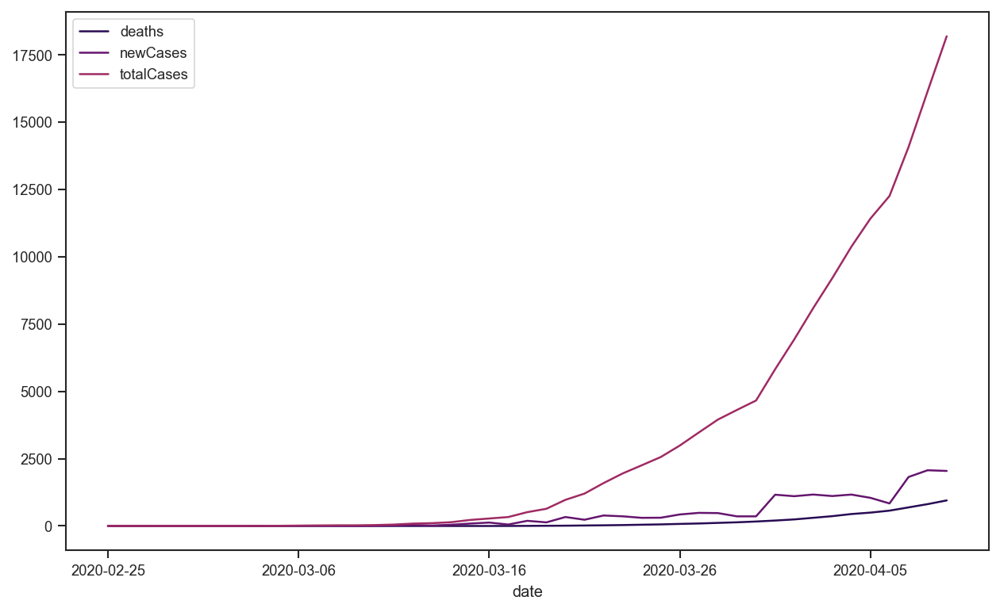

In [904]:
dt_tm_br_totals.plot();

In [894]:
dt_tm_city = dt_tm.loc[(dt_tm['state'] != 'TOTAL')].copy()
dt_tm_city.rename(columns={'ibgeID':'COD. IBGE'}, inplace=True)

### Brazilian Population by city

Data from [IBGE - Estimativas da População](https://www.ibge.gov.br/estatisticas/sociais/populacao/9103-estimativas-de-populacao.html?edicao=25272&t=downloads)

Explanation: [Lista de municípios do Brasil por população - Wikipedia](https://pt.wikipedia.org/wiki/Lista_de_munic%C3%ADpios_do_Brasil_por_população)

In [11]:
br_pop = pd.read_excel('../data/IBGE_Brazil_Population_Estimation_2019.xlsx')
br_pop.shape

(5570, 6)

In [12]:
br_pop.head()

,UF,COD. UF,COD. MUNIC,NOME DO MUNICÍPIO,COD. IBGE,POPULAÇÃO ESTIMADA
0,RO,11,15,Alta Floresta D'Oeste,1100015,22945
1,RO,11,23,Ariquemes,1100023,107863
2,RO,11,31,Cabixi,1100031,5312
3,RO,11,49,Cacoal,1100049,85359
4,RO,11,56,Cerejeiras,1100056,16323


In [13]:
br_pop.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5570 entries, 0 to 5569
Data columns (total 6 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   UF                  5570 non-null   object
 1   COD. UF             5570 non-null   int64 
 2   COD. MUNIC          5570 non-null   int64 
 3   NOME DO MUNICÍPIO   5570 non-null   object
 4   COD. IBGE           5570 non-null   int64 
 5   POPULAÇÃO ESTIMADA  5570 non-null   int64 
dtypes: int64(4), object(2)
memory usage: 261.2+ KB


In [14]:
print('Number of Brazilian cities: {:,}'.format(len(br_pop)))
print('Total Brazilian population: {:,}'.format(br_pop['POPULAÇÃO ESTIMADA'].sum()))

Number of Brazilian cities: 5,570
Total Brazilian population: 210,147,125


## GeoData (Brasil & Municipalities)

In [15]:
!ls ../geo_data

BRMUE250GC_SIR.cpg BRMUE250GC_SIR.shp Municipios
BRMUE250GC_SIR.dbf BRMUE250GC_SIR.shx estados
BRMUE250GC_SIR.prj Brasil             out_data


In [16]:
br_shp = gpd.read_file('../geo_data/Brasil/UFEBRASIL.shp')
br_shp.shape

(27, 5)

In [17]:
br_shp.rename(columns={'CD_GEOCODU': 'COD. UF'}, inplace=True)
br_shp['COD. UF'] = br_shp['COD. UF'].astype('int64')
br_shp.head(2)

,ID,COD. UF,NM_ESTADO,NM_REGIAO,geometry
0,1,11,RONDÔNIA,NORTE,"POLYGON ((-63.32721 -7.97672, -63.11838 -7.977..."
1,2,12,ACRE,NORTE,"POLYGON ((-73.18253 -7.33550, -73.13680 -7.352..."


In [160]:
br_shp

,ID,COD. UF,NM_ESTADO,NM_REGIAO,geometry
0,1,11,RONDÔNIA,NORTE,"POLYGON ((-63.32721 -7.97672, -63.11838 -7.977..."
1,2,12,ACRE,NORTE,"POLYGON ((-73.18253 -7.33550, -73.13680 -7.352..."
2,3,13,AMAZONAS,NORTE,"POLYGON ((-67.32609 2.02971, -67.31682 2.00125..."
3,4,14,RORAIMA,NORTE,"POLYGON ((-60.20051 5.26434, -60.19828 5.26045..."
4,5,15,PARÁ,NORTE,"MULTIPOLYGON (((-54.95431 2.58369, -54.93542 2..."
5,6,16,AMAPÁ,NORTE,"MULTIPOLYGON (((-51.17970 4.00008, -51.17784 3..."
6,1,17,TOCANTINS,NORTE,"POLYGON ((-48.35878 -5.17008, -48.35315 -5.173..."
7,1,21,MARANHÃO,NORDESTE,"MULTIPOLYGON (((-45.84073 -1.04548, -45.84099 ..."
8,1,22,PIAUÍ,NORDESTE,"POLYGON ((-41.74605 -2.80350, -41.74241 -2.805..."
9,2,23,CEARÁ,NORDESTE,"POLYGON ((-41.16703 -4.46736, -41.16220 -4.466..."


In [18]:
mun_shp = gpd.read_file('../geo_data/BRMUE250GC_SIR.shp', encoding = 'utf-8')
mun_shp.shape

(5572, 3)

In [19]:
mun_shp.rename(columns = {'CD_GEOCMU': 'COD. IBGE'}, inplace=True)
mun_shp['COD. IBGE'] = mun_shp['COD. IBGE'].astype('int64')
mun_shp.head(2)

,NM_MUNICIP,COD. IBGE,geometry
0,CACHOEIRA DO PIRIÁ,1501956,"POLYGON ((-46.31955 -1.75518, -46.31990 -1.755..."
1,SÃO JOSÉ DOS BASÍLIOS,2111250,"POLYGON ((-44.63409 -5.03498, -44.63407 -5.034..."


## Creating a single Dataset with Population, territory and pop density

**Calculating aprox. city areas in m2**
- For a real area calculation: [Lista de municípios brasileiros por área decrescente - Wikipedia](https://pt.wikipedia.org/wiki/Lista_de_munic%C3%ADpios_brasileiros_por_área_decrescente)

In [20]:
tost = mun_shp.copy()
tost = tost.to_crs(epsg=3395)
tost["area"] = tost['geometry'].area/ 10**6
del tost['NM_MUNICIP']
del tost['geometry']
tost.head(2)

,COD. IBGE,area
0,1501956,"2,422.5106761430625"
1,2111250,355.9684085285142


In [21]:
mun_shp = pd.merge(tost, mun_shp, on='COD. IBGE')
br_cities = pd.merge(br_pop, mun_shp, on='COD. IBGE')
br_cities = gpd.GeoDataFrame(br_cities, crs='4326')
br_cities.shape

(5570, 9)

In [22]:
del br_cities['COD. MUNIC']
del br_cities['NM_MUNICIP']
br_cities.rename(columns={'area': 'AREA [KMˆ2]'}, inplace=True)
br_cities['AREA [KMˆ2]'] = round(br_cities['AREA [KMˆ2]'], 2)
br_cities['DENS. DEMOG. [hab/kmˆ2]'] = round(br_cities['POPULAÇÃO ESTIMADA'] / br_cities['AREA [KMˆ2]'], 2)
br_cities.head(2)

,UF,COD. UF,NOME DO MUNICÍPIO,COD. IBGE,POPULAÇÃO ESTIMADA,AREA [KMˆ2],geometry,DENS. DEMOG. [hab/kmˆ2]
0,RO,11,Alta Floresta D'Oeste,1100015,22945,"7,410.66","POLYGON ((-62.23224 -11.90804, -62.22630 -11.8...",3.1
1,RO,11,Ariquemes,1100023,107863,"4,561.93","POLYGON ((-63.57327 -9.78326, -63.57304 -9.781...",23.64


In [23]:
print('Number of Brazilian Cities: {:,}'.format(len(br_cities.index)))
print('Total Brazilian Population: {:,}'.format(br_cities['POPULAÇÃO ESTIMADA'].sum()))
print('Total Brazilian Territory : {:,} km2 (aprox.)'.format(round(br_cities['AREA [KMˆ2]'].sum())))
print('Average Demografic Density : {:,} hab/km2 (aprox.)'.format(round((br_cities['POPULAÇÃO ESTIMADA'].sum())/(br_cities['AREA [KMˆ2]'].sum()))))

Number of Brazilian Cities: 5,570
Total Brazilian Population: 210,147,125
Total Brazilian Territory : 8,985,590.0 km2 (aprox.)
Average Demografic Density : 23.0 hab/km2 (aprox.)


### Alternative dataset with Point

In [55]:
br_cities['LATITUDE'] = br_cities.representative_point().y
br_cities['LONGITUDE'] = br_cities.representative_point().x

In [56]:
temp = br_cities.copy()
del temp['geometry']
br_cities_pnt = gpd.GeoDataFrame(temp, geometry=gpd.points_from_xy(temp.LONGITUDE, temp.LATITUDE))

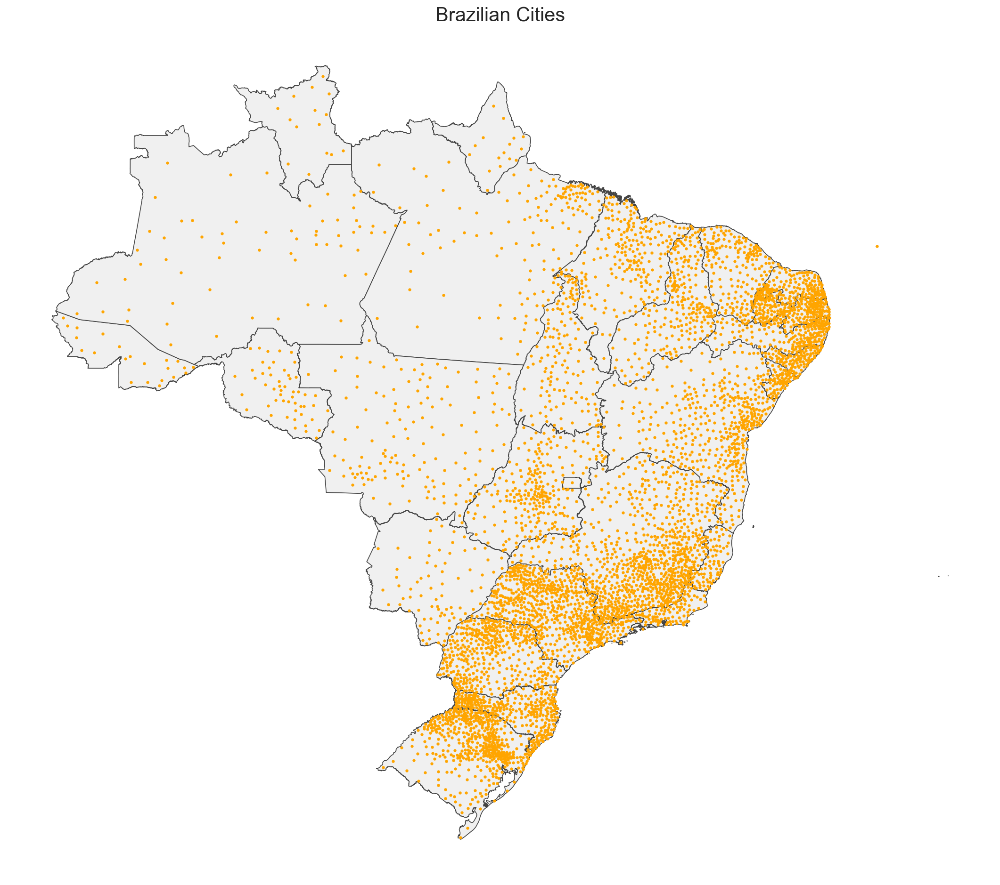

In [57]:
ax = br_shp.plot(figsize=(18, 16), color='#F0F0F0', edgecolor='#444444')
br_cities_pnt.plot(ax=ax, color="orange", markersize=5, label='City')
plt.title("Brazilian Cities", fontsize = 20);
plt.axis('off');

### Grouping State data

In [58]:
br_state = br_cities.groupby('UF', as_index=False).agg({
    'COD. UF': 'first',
    'NOME DO MUNICÍPIO': 'count',
    'POPULAÇÃO ESTIMADA': 'sum',
    'AREA [KMˆ2]': 'sum'
})
br_state.shape

(27, 5)

In [59]:
br_state.rename(columns={'NOME DO MUNICÍPIO':'QTD MUNICÍPIOS'}, inplace=True)
br_state['DENS. DEMOG. [hab/kmˆ2]'] = round(br_state['POPULAÇÃO ESTIMADA'] / br_state['AREA [KMˆ2]'], 2)
br_state['AREA [KMˆ2]'] = round(br_state['AREA [KMˆ2]'], 2)
br_state

,UF,COD. UF,QTD MUNICÍPIOS,POPULAÇÃO ESTIMADA,AREA [KMˆ2],DENS. DEMOG. [hab/kmˆ2]
0,AC,12,22,881935,"168,458.35",5.24
1,AL,27,102,3337357,"28,621.12",116.6
2,AM,13,62,4144597,"1,571,148.4",2.64
3,AP,16,16,845731,"142,618.28",5.93
4,BA,29,417,14873064,"592,928.26",25.08
5,CE,23,184,9132078,"150,137.08",60.82
6,DF,53,1,3015268,"6,217.88",484.94
7,ES,32,78,4018650,"51,875.9",77.47
8,GO,52,246,7018354,"368,391.83",19.05
9,MA,21,217,7075181,"332,594.66",21.27


In [60]:
print('Number of Brazilian Cities: {:,}'.format(br_state['QTD MUNICÍPIOS'].sum()))
print('Total Brazilian Population: {:,}'.format(br_state['POPULAÇÃO ESTIMADA'].sum()))
print('Total Brazilian Territory : {:,} km2 (aprox.)'.format(round(br_state['AREA [KMˆ2]'].sum())))

Number of Brazilian Cities: 5,570
Total Brazilian Population: 210,147,125
Total Brazilian Territory : 8,985,590.0 km2 (aprox.)


In [61]:
br_state = pd.merge(br_state, br_shp, on='COD. UF')
br_state= gpd.GeoDataFrame(br_state, crs='4326')
br_state.shape

(27, 10)

In [62]:
br_state.head(2)

,UF,COD. UF,QTD MUNICÍPIOS,POPULAÇÃO ESTIMADA,AREA [KMˆ2],DENS. DEMOG. [hab/kmˆ2],ID,NM_ESTADO,NM_REGIAO,geometry
0,AC,12,22,881935,"168,458.35",5.24,2,ACRE,NORTE,"POLYGON ((-73.18253 -7.33550, -73.13680 -7.352..."
1,AL,27,102,3337357,"28,621.12",116.6,1,ALAGOAS,NORDESTE,"POLYGON ((-35.46753 -8.81744, -35.46659 -8.817..."


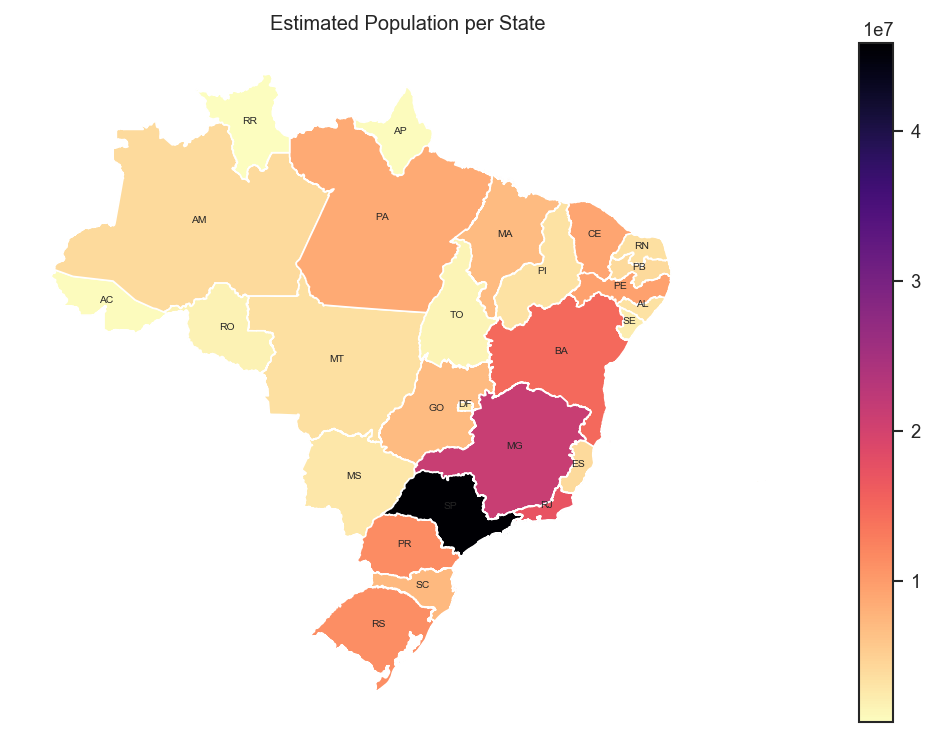

In [63]:
ax = br_state.plot(column='POPULAÇÃO ESTIMADA', cmap='magma_r', legend=True)
plt.title("Estimated Population per State");
ax.set_axis_off()
for idx, row in br_state.iterrows():
    plt.annotate(s=row['UF'], xy=(row.geometry.centroid.x, row.geometry.centroid.y),
                 horizontalalignment='center', fontsize=5);

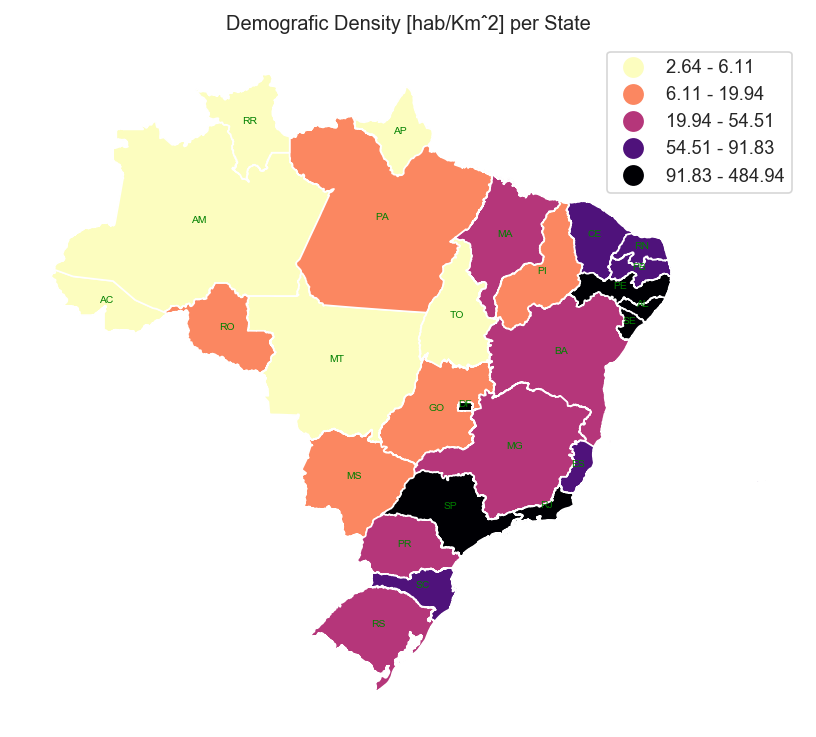

In [64]:
ax = br_state.plot(column='DENS. DEMOG. [hab/kmˆ2]', cmap='magma_r', scheme='quantiles', legend=True)
plt.title("Demografic Density [hab/Kmˆ2] per State");
ax.set_axis_off()
for idx, row in br_state.iterrows():
    plt.annotate(s=row['UF'], xy=(row.geometry.centroid.x, row.geometry.centroid.y),
                 horizontalalignment='center', fontsize=5, color='green');

## Getting POIs

OpenStreetMap data from:
http://download.geofabrik.de/south-america/brazil.html

In [24]:
!ls ../OSM

brazil-140101-free       nordeste-latest-free     sudeste-latest-free
centro-oeste-latest-free norte-latest-free        sul-latest-free


**SouthEast Roads**

In [146]:
!ls ../OSM/sudeste-latest-free

README                         gis_osm_pois_free_1.cpg
gis_osm_buildings_a_free_1.cpg gis_osm_pois_free_1.dbf
gis_osm_buildings_a_free_1.dbf gis_osm_pois_free_1.prj
gis_osm_buildings_a_free_1.prj gis_osm_pois_free_1.shp
gis_osm_buildings_a_free_1.shp gis_osm_pois_free_1.shx
gis_osm_buildings_a_free_1.shx gis_osm_railways_free_1.cpg
gis_osm_landuse_a_free_1.cpg   gis_osm_railways_free_1.dbf
gis_osm_landuse_a_free_1.dbf   gis_osm_railways_free_1.prj
gis_osm_landuse_a_free_1.prj   gis_osm_railways_free_1.shp
gis_osm_landuse_a_free_1.shp   gis_osm_railways_free_1.shx
gis_osm_landuse_a_free_1.shx   gis_osm_roads_free_1.cpg
gis_osm_natural_a_free_1.cpg   gis_osm_roads_free_1.dbf
gis_osm_natural_a_free_1.dbf   gis_osm_roads_free_1.prj
gis_osm_natural_a_free_1.prj   gis_osm_roads_free_1.shp
gis_osm_natural_a_free_1.shp   gis_osm_roads_free_1.shx
gis_osm_natural_a_free_1.shx   gis_osm_traffic_a_free_1.cpg
gis_osm_natural_free_1.cpg     gis_osm_traffic_a_free_1.dbf
gis_osm_natural_free_1.dbf    

In [147]:
file = '../OSM/sudeste-latest-free/gis_osm_roads_free_1.shp'

In [148]:
se_roads_shp = gpd.read_file(file, encoding = 'utf-8')
se_roads_shp.shape

(1617775, 11)

In [149]:
se_motorway = se_roads_shp.loc[se_roads_shp.fclass == 'motorway'].copy()
se_motorway.shape

(14223, 11)

In [150]:
se_primary = se_roads_shp.loc[se_roads_shp.fclass == 'primary'].copy()
se_primary.shape

(39251, 11)

In [151]:
# liberating memory
lst = [se_roads_shp]
del se_roads_shp
del lst

In [166]:
se_shp = br_shp.loc[(br_shp['COD. UF'] == 35) | 
                    (br_shp['COD. UF'] == 31) |
                    (br_shp['COD. UF'] == 33) 
                   ].copy()
se_shp = se_shp.to_crs({'init': 'epsg:4326'})

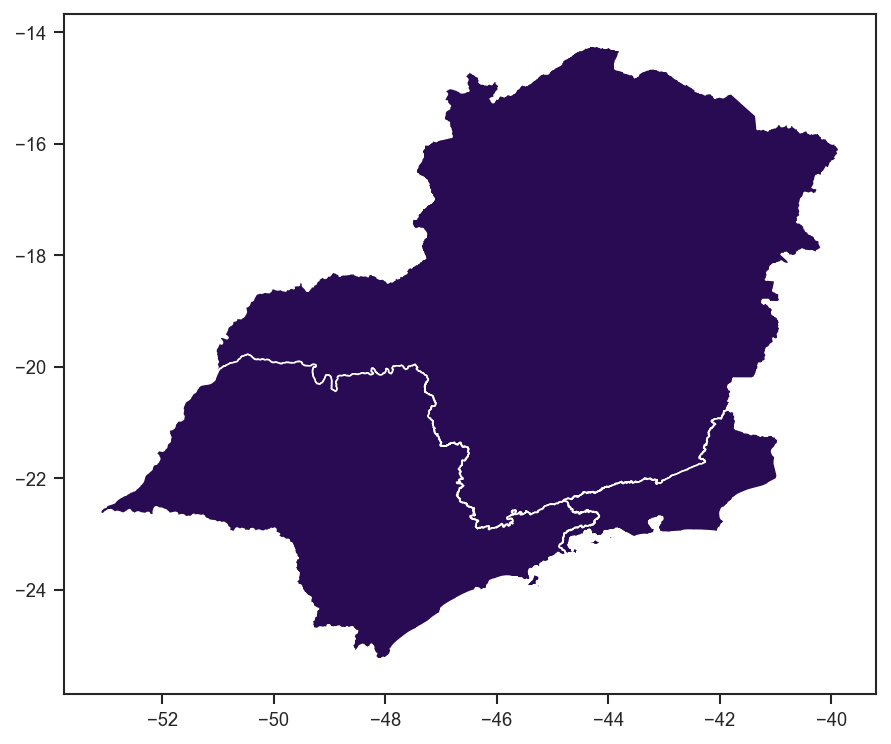

In [167]:
se_shp.plot();

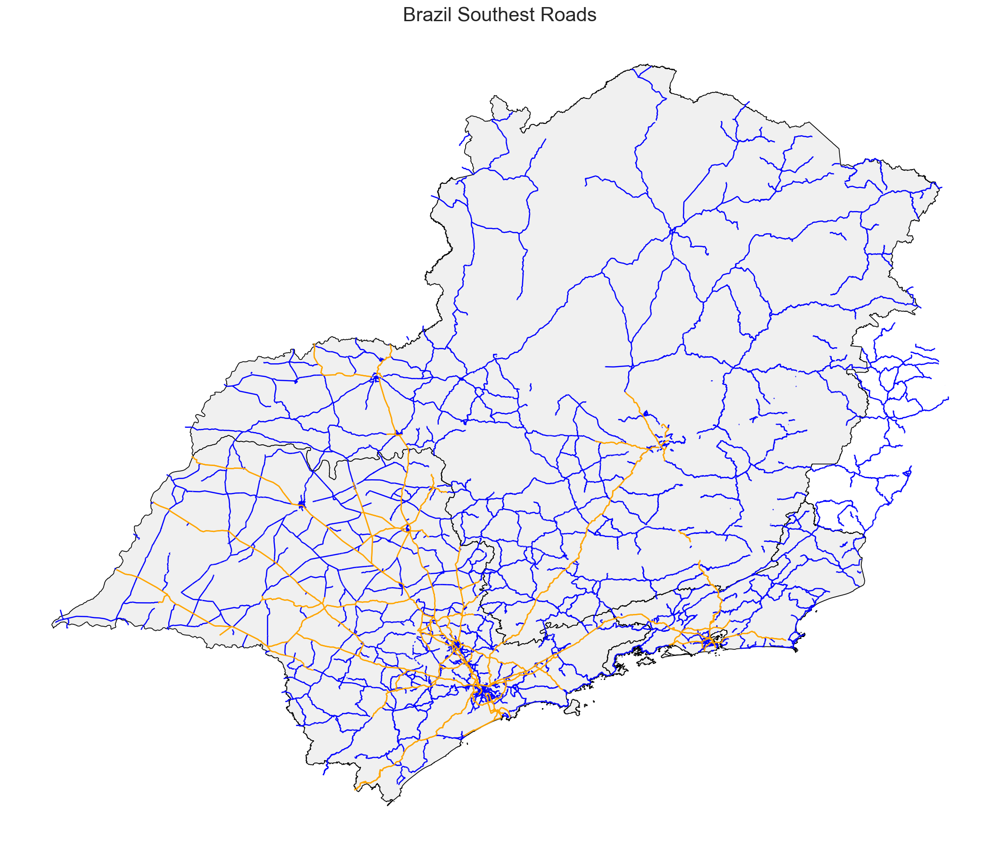

In [168]:
ax = se_shp.plot(figsize=(18, 16), color='#F0F0F0', edgecolor='#000000')
se_primary.plot(ax=ax, color="blue")
se_motorway.plot(ax=ax, color="orange", markersize=5)
plt.title("Brazil Southeast Roads", fontsize = 20);
plt.axis('off');

**NorthEast Roads**

In [495]:
file = '../OSM/nordeste-latest-free/gis_osm_roads_free_1.shp'

ne_roads_shp = gpd.read_file(file, encoding = 'utf-8')
ne_roads_shp.shape

(982532, 11)

In [496]:
ne_motorway = ne_roads_shp.loc[ne_roads_shp.fclass == 'motorway'].copy()
ne_motorway.shape

(887, 11)

In [497]:
ne_primary = ne_roads_shp.loc[ne_roads_shp.fclass == 'primary'].copy()
ne_primary.shape

(22835, 11)

In [498]:
# liberating memory
lst = [ne_roads_shp]
del ne_roads_shp
del lst

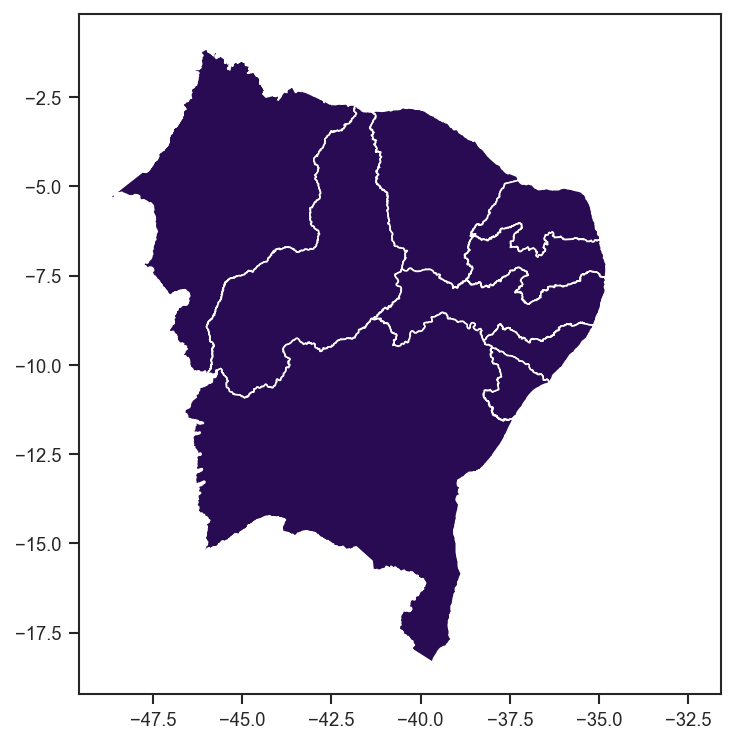

In [499]:
ne_shp = br_shp.loc[(br_shp['NM_REGIAO'] == 'NORDESTE')].copy()
ne_shp = ne_shp.to_crs({'init': 'epsg:4326'})

ne_shp.plot();

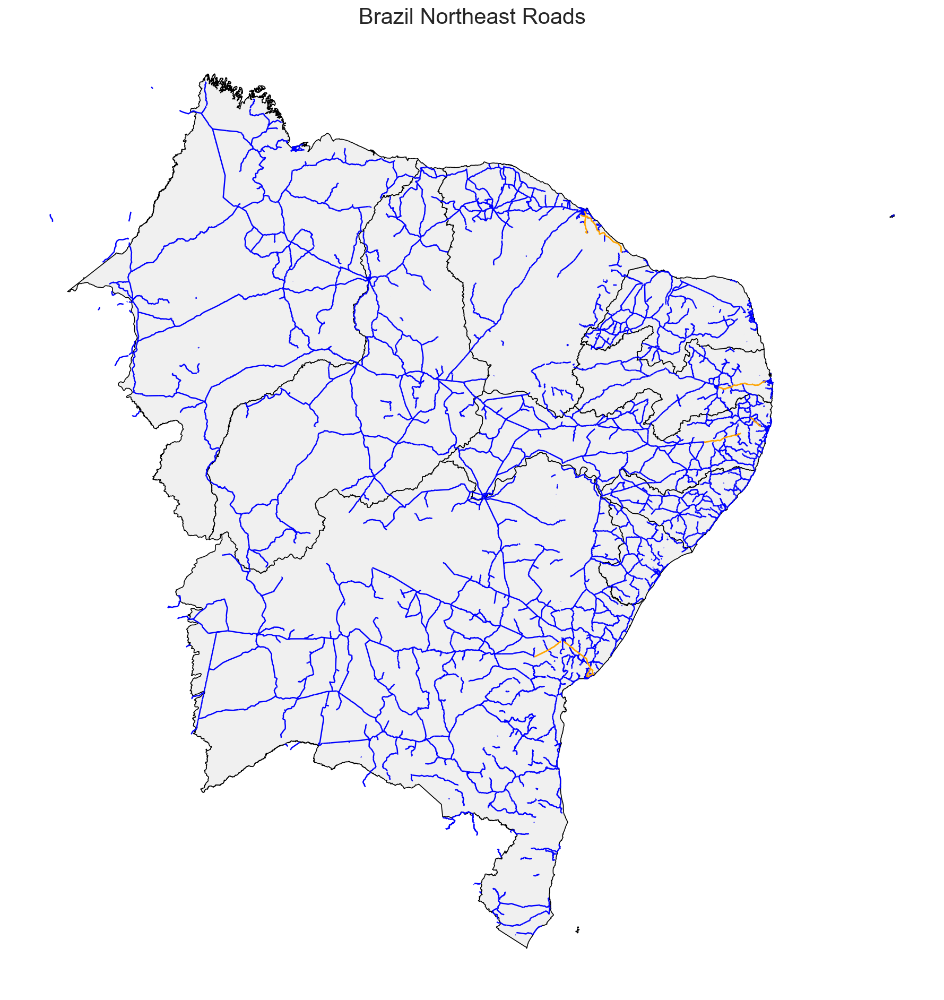

In [500]:
ax = ne_shp.plot(figsize=(18, 16), color='#F0F0F0', edgecolor='#000000')
ne_primary.plot(ax=ax, color="blue")
ne_motorway.plot(ax=ax, color="orange", markersize=5)
plt.title("Brazil Northeast Roads", fontsize = 20);
plt.axis('off');

### Looking Sao Paulo State

In [173]:
sp_shp = se_shp.loc[se_shp['COD. UF'] == 35].copy()
sp_shp = sp_shp.to_crs({'init': 'epsg:4326'})

In [174]:
sp_motorway = gpd.sjoin(se_motorway, sp_shp, op='intersects')

In [175]:
sp_primary = gpd.sjoin(se_primary, sp_shp, op='intersects')

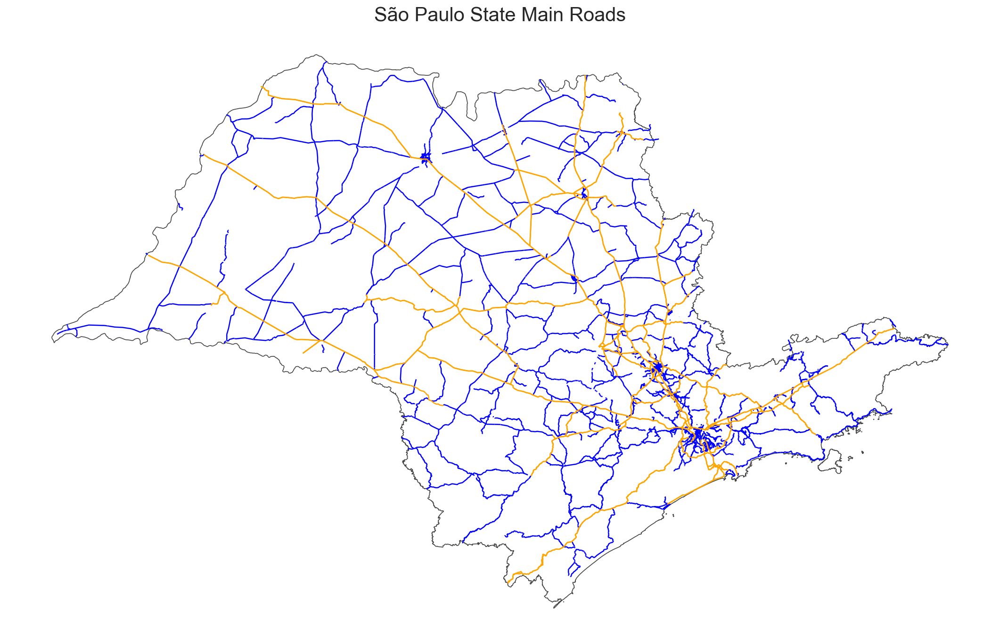

In [176]:
ax = sp_shp.plot(figsize=(18, 16), color='#FFFFFF', edgecolor='#444444')
sp_primary.plot(ax=ax, color="blue", markersize=1)
sp_motorway.plot(ax=ax, color="orange", markersize=1)
plt.title("São Paulo State Main Roads", fontsize = 20);
plt.axis('off');

### Looking Minas Gerais State

In [177]:
mg_shp = se_shp.loc[se_shp['COD. UF'] == 31].copy()
mg_shp = mg_shp.to_crs({'init': 'epsg:4326'})

In [178]:
mg_motorway = gpd.sjoin(se_motorway, mg_shp, op='intersects')

In [179]:
mg_primary = gpd.sjoin(se_primary, mg_shp, op='intersects')

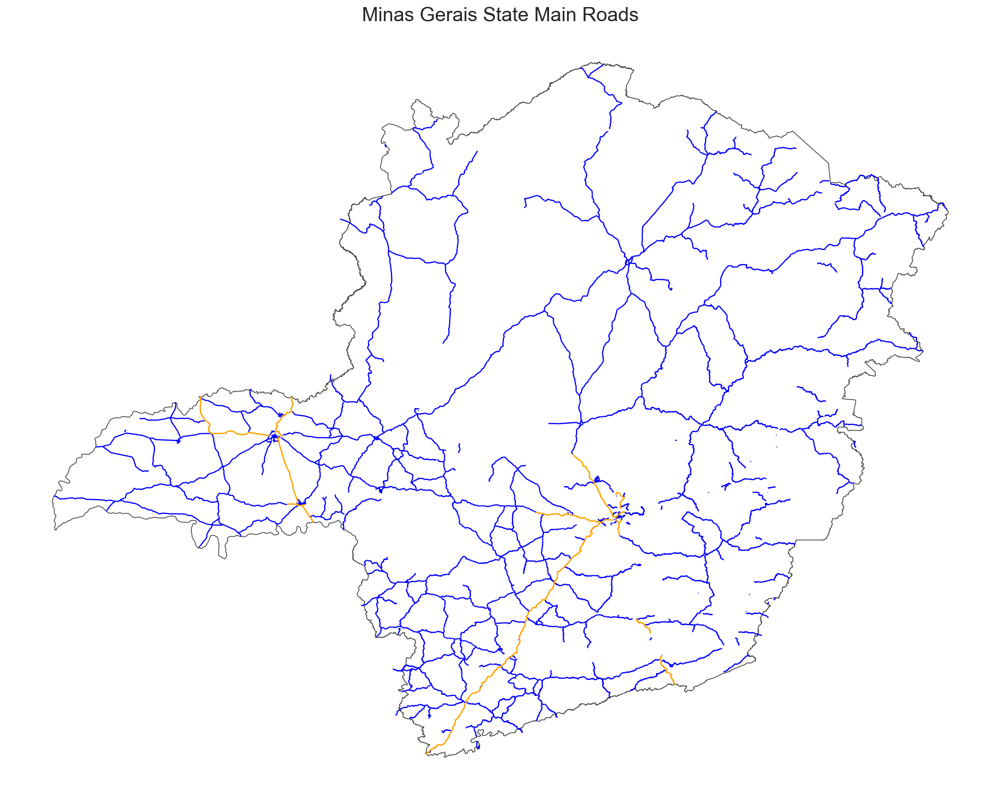

In [180]:
ax = mg_shp.plot(figsize=(18, 16), color='#FFFFFF', edgecolor='#444444')
mg_primary.plot(ax=ax, color="blue", markersize=1)
mg_motorway.plot(ax=ax, color="orange", markersize=1)
plt.title("Minas Gerais State Main Roads", fontsize = 20);
plt.axis('off');

### Looking Rio de Janeiro State

In [181]:
rj_shp = se_shp.loc[se_shp['COD. UF'] == 33].copy()
rj_shp = rj_shp.to_crs({'init': 'epsg:4326'})

In [182]:
rj_motorway = gpd.sjoin(se_motorway, rj_shp, op='intersects')

In [183]:
rj_primary = gpd.sjoin(se_primary, rj_shp, op='intersects')

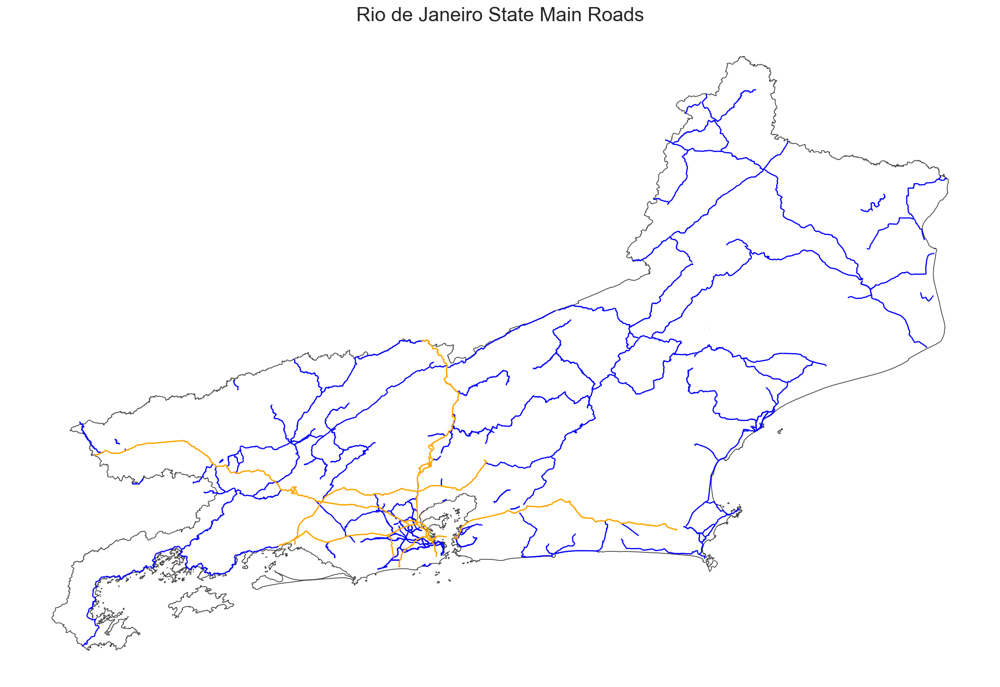

In [184]:
ax = rj_shp.plot(figsize=(18, 16), color='#FFFFFF', edgecolor='#444444')
rj_primary.plot(ax=ax, color="blue", markersize=1)
rj_motorway.plot(ax=ax, color="orange", markersize=1)
plt.title("Rio de Janeiro State Main Roads", fontsize = 20);
plt.axis('off');

### Looking Ceará State

In [501]:
ce_shp = ne_shp.loc[ne_shp['COD. UF'] == 23].copy()
ce_shp = ce_shp.to_crs({'init': 'epsg:4326'})

In [502]:
ce_motorway = gpd.sjoin(ne_motorway, ce_shp, op='intersects')

In [503]:
ce_primary = gpd.sjoin(ne_primary, ce_shp, op='intersects')

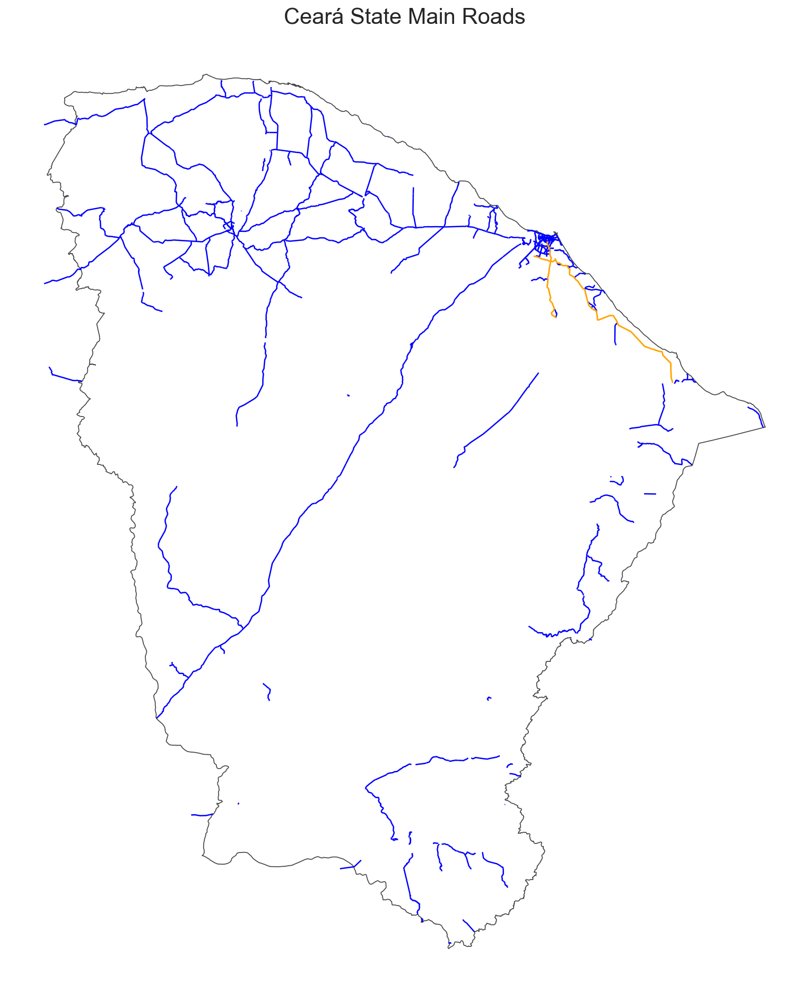

In [504]:
ax = ce_shp.plot(figsize=(18, 16), color='#FFFFFF', edgecolor='#444444')
ce_primary.plot(ax=ax, color="blue", markersize=1)
ce_motorway.plot(ax=ax, color="orange", markersize=1)
plt.title("Ceará State Main Roads", fontsize = 20);
plt.axis('off');

## Maping CoronaVirus data

### Support Functions

In [909]:
def get_Brazil_data(dt):
    total_cases = dt.totalCases.sum()
    deaths = dt.deaths.sum()
    cfr = round ((deaths/total_cases)*100, 2)
    date = datetime.datetime.today()
    cv_city = pd.merge(dt, br_cities, on='COD. IBGE')
    cv_city = gpd.GeoDataFrame(cv_city, crs='4326')
    cv_city['TotalCases/1M pop'] = round(cv_city.totalCases/(cv_city['POPULAÇÃO ESTIMADA']/1000_000), 1)
    cv_city['Deaths/1M pop'] = round(cv_city.deaths/(cv_city['POPULAÇÃO ESTIMADA']/1000_000), 1)
    deaths_city = cv_city.loc[cv_city['deaths'] != 0].copy()
    cv_city_pnt = cv_city.copy()
    cv_city_pnt['geometry'] = cv_city_pnt['geometry'].representative_point()
    deaths_city_pnt = cv_city_pnt[cv_city_pnt.deaths != 0]
    print('Brazil: Total number of Covid19 cases at {}/{}: {:,} ({} fatal) in {} cities with a CFR of {}%'.
        format(date.month, date.day, total_cases, deaths, len(cv_city.index), cfr))
     
    dt_city = cv_city_pnt.sort_values('totalCases', ascending=False).copy()
    dt_city = dt_city[[
    'NOME DO MUNICÍPIO', 'UF', 'POPULAÇÃO ESTIMADA', 'AREA [KMˆ2]',
    'DENS. DEMOG. [hab/kmˆ2]', 'totalCases', 'deaths', 'CFR[%]', 'TotalCases/1M pop', 'Deaths/1M pop', 'LATITUDE', 'LONGITUDE']].reset_index(drop=True)
    dt_city.index += 1
    file = '../data_out/cv19_Brazil_'+str(date.month)+'-'+str(date.day)+'-'+str(date.year)+'.xlsx'
    dt_city.to_excel(file)

    return cv_city, deaths_city, cv_city_pnt, deaths_city_pnt, total_cases, deaths, cfr

In [910]:
def plt_Brasil_cities(cv_city,
                      deaths_city,
                      date,
                      total_cases,
                      deaths,
                      cfr,
                      deaths_only=False):
    ax = br_state.plot(figsize=(18, 16), color='#FFFFFF', edgecolor='#444444')
    if deaths_only == False:
        cv_city.plot(ax=ax, color="orange", markersize=5, label='City')
    deaths_city.plot(ax=ax,
                     color="red",
                     markersize=5,
                     label='City with Deaths')
    plt.title(
        'Brazil: Covid19 total cases at {}/{}/{}: {:,} ({} fatal in red) in {} identified cities with a CFR of {}%'
        .format(date.year, date.month, date.day, total_cases, deaths,
                len(cv_city.index), cfr),
        fontsize=20,
        loc='left')
    plt.axis('off')

    for idx, row in br_state.iterrows():
        plt.annotate(s=row['UF'],
                     xy=(row.geometry.centroid.x, row.geometry.centroid.y),
                     horizontalalignment='center',
                     fontsize=10,
                     color='green')

    plt.annotate('Map created by Marcelo Rovai (MJRoBot.org) @{}/{}/{}'.format(
        date.year, date.month, date.day),
                 xy=(0.55, .17),
                 xycoords='figure fraction',
                 horizontalalignment='left',
                 fontsize=12,
                 color='blue')
    plt.annotate('Data provided by https://labs.wesleycota.com/sarscov2/br/',
                 xy=(0.55, .16),
                 xycoords='figure fraction',
                 horizontalalignment='left',
                 fontsize=12,
                 color='blue')
    plt.annotate(
        'License: CC BY-SA 4.0 (https://creativecommons.org/licenses/by-sa/4.0/',
        xy=(0.55, .15),
        xycoords='figure fraction',
        horizontalalignment='left',
        fontsize=12,
        color='blue')

    file_today = '../images/!cv19_BR_last_updated.png'
    file = '../images/cv19_Brazil_' + str(date.month) + '-' + str(
        date.day) + '-' + str(date.year) + '.png'
    file_gif = '../br_images_gif/today_cv19_Brazil.png'

    if deaths_only == False:
        plt.savefig(file, dpi=300)
        plt.savefig(file_today, dpi=300)
        plt.savefig(file_gif, dpi=200)

In [915]:
def plt_Brasil_cv_metrics(cv_city_pnt,
                          deaths_city_pnt,
                          date,
                          total_cases,
                          deaths,
                          cfr,
                          metrics='totalCases',
                          n=4):
    ax = br_state.plot(figsize=(18, 16), color='#FFFFFF', edgecolor='#444444')
    cv_city_pnt.plot(ax=ax,
                     color='orange',
                     markersize=n * cv_city_pnt[metrics],
                     alpha=.5)
    if metrics == 'totalCases':
        deaths_city_pnt.plot(ax=ax,
                             color='black',
                             marker='+',
                             alpha=.5,
                             markersize=100,
                             label='Deaths')
        ax.legend(fontsize=15)
        plt.title(
            'Brazil: Covid19 total cases at {}/{}/{}: {:,} ({} fatal) in {} identified cities with a CFR of {}%'
            .format(date.year, date.month, date.day, total_cases, deaths,
                    len(cv_city.index), cfr),
            fontsize=20,
            loc='left')
    elif metrics == 'CFR[%]':
        plt.title(
            'Covid19 Case Fatality Rate (CFR[%]) per city in Brazil at {}/{}/{}'
            .format(date.year, date.month, date.day),
            fontsize=20,
            loc='left')
    elif metrics == 'TotalCases/1M pop':
        plt.title(
            'Covid19 Total Cases per each 1 Million inhabitants per city in Brazil at {}/{}/{}'
            .format(date.year, date.month, date.day),
            fontsize=20,
            loc='left')
    elif metrics == 'Deaths/1M pop':
        plt.title(
            'Covid19 Deaths per each 1 Million inhabitants per city in Brazil at {}/{}/{}'
            .format(date.year, date.month, date.day),
            fontsize=20,
            loc='left')

    plt.axis('off')

    for idx, row in br_state.iterrows():
        plt.annotate(s=row['UF'],
                     xy=(row.geometry.centroid.x, row.geometry.centroid.y),
                     horizontalalignment='center',
                     fontsize=10,
                     color='green')

    plt.annotate('Map created by Marcelo Rovai (MJRoBot.org) @{}/{}/{}'.format(
        date.year, date.month, date.day),
                 xy=(0.55, .15),
                 xycoords='figure fraction',
                 horizontalalignment='left',
                 fontsize=12,
                 color='blue')
    plt.annotate('Data provided by https://labs.wesleycota.com/sarscov2/br/',
                 xy=(0.55, .14),
                 xycoords='figure fraction',
                 horizontalalignment='left',
                 fontsize=12,
                 color='blue')
    plt.annotate(
        'License: CC BY-SA 4.0 (https://creativecommons.org/licenses/by-sa/4.0/',
        xy=(0.55, .13),
        xycoords='figure fraction',
        horizontalalignment='left',
        fontsize=12,
        color='blue')

    metrics = metrics.replace('/', '_per_')
    metrics = metrics.replace(' ', '_')

    file_today = '../images/!cv19_BR_CV_' + metrics + '_last_updated.png'
    file = '../images/cv19_Brazil_CV_' + metrics + '_' + str(
        date.month) + '-' + str(date.day) + '-' + str(date.year) + '.png'
    plt.savefig(file, dpi=300)
    plt.savefig(file_today, dpi=300)

In [648]:
def get_state_info(cv_city, dt_state, state):
    date = datetime.datetime.today()
    
    cv_state = cv_city.loc[cv_city['UF'] == state].copy()
    deaths_state = cv_state.loc[cv_state['deaths'] != 0].copy()
    state_total_cases = dt_state[dt_state.state == state].totalCases.sum()
    state_deaths = dt_state[dt_state.state == state].deaths.sum()
    print(
        'Total number of Covid19 cases reported in {} State at {}/{}: {:,} ({} fatal) in {} specified cities'
        .format(state, date.month, date.day, state_total_cases, state_deaths,
                len(cv_state.index)))
    plot_state_cases(state, cv_state, deaths_state, state_total_cases, state_deaths, date)
    dt_state = cv_state.sort_values('totalCases', ascending=False).copy()
    dt_state = dt_state[[
        'NOME DO MUNICÍPIO', 'UF', 'POPULAÇÃO ESTIMADA', 'AREA [KMˆ2]',
        'DENS. DEMOG. [hab/kmˆ2]', 'totalCases', 'deaths'
    ]].reset_index(drop=True)
    dt_state.index += 1
    file = '../data_out/cv19_'+state+'_'+str(date.month)+'-'+str(date.day)+'-'+str(date.year)+'.xlsx'
    dt_state.to_excel(file)
    return cv_state, deaths_state, state_total_cases, state_deaths

In [863]:
def plot_state_cases(state, cv_state, deaths_state, state_total_cases,
                     state_deaths, date):
    if state == 'SP':
        ax = sp_shp.plot(figsize=(18, 16),
                         color='#FFFFFF',
                         edgecolor='#444444')
        sp_motorway.plot(ax=ax, color="green", markersize=1, label='Motorway')
        sp_primary.plot(ax=ax,
                        color="#E8E8E8",
                        markersize=1,
                        label='Primary Roads')
        xy_1 = (-47.2, -25)
        xy_2 = (-47.2, -25.1)
        xy_3 = (-47.2, -25.2)
    if state == 'RJ':
        ax = rj_shp.plot(figsize=(18, 16),
                         color='#FFFFFF',
                         edgecolor='#444444')
        rj_motorway.plot(ax=ax, color="green", markersize=1, label='Motorway')
        rj_primary.plot(ax=ax,
                        color="#E8E8E8",
                        markersize=1,
                        label='Primary Roads')
        xy_1 = (-42.3, -23.1)
        xy_2 = (-42.3, -23.15)
        xy_3 = (-42.3, -23.2)
    if state == 'MG':
        ax = mg_shp.plot(figsize=(18, 16),
                         color='#FFFFFF',
                         edgecolor='#444444')
        mg_motorway.plot(ax=ax, color="green", markersize=1, label='Motorway')
        mg_primary.plot(ax=ax,
                        color="#E8E8E8",
                        markersize=1,
                        label='Primary Roads')
        xy_1 = (-44.7, -22.8)
        xy_2 = (-44.7, -22.95)
        xy_3 = (-44.7, -23.1)

    if state == 'CE':
        ax = ce_shp.plot(figsize=(18, 16),
                         color='#FFFFFF',
                         edgecolor='#444444')
        ce_motorway.plot(ax=ax, color="green", markersize=1, label='Motorway')
        ce_primary.plot(ax=ax,
                        color="#E8E8E8",
                        markersize=1,
                        label='Primary Roads')
        xy_1 = (-39, -7.95)
        xy_2 = (-39, -8.01)
        xy_3 = (-39, -8.07)

    
        
    cv_state.plot(ax=ax, color="orange", markersize=5, label='City')
    deaths_state.plot(ax=ax,
                      color="red",
                      markersize=5,
                      label='City with Deaths')

    plt.title(
        'Covid19 total cases reported in {} State at {}/{}/{}: {:,} ({} fatal in red) in {} identified cities'
        .format(state, date.year, date.month, date.day, state_total_cases, state_deaths,
                len(cv_state.index)),
        fontsize=20, loc='left')
    plt.axis('off')
    ax.legend(fontsize=15)
    
    plt.annotate(
        'Map created by Marcelo Rovai (MJRoBot.org) @{}/{}/{}'.format(
            date.year, date.month, date.day),
        xy=xy_1,
        fontsize=10,
        color='blue')
    plt.annotate('Data provided by https://labs.wesleycota.com/sarscov2/br/',
                 xy=xy_2,
                 fontsize=10,
                 color='blue')
    plt.annotate(
        'License: CC BY-SA 4.0 (https://creativecommons.org/licenses/by-sa/4.0/)',
        xy=xy_3,
        fontsize=10,
        color='blue')
    
    file_today = '../images/!cv19_'+ state +'_last_updated.png'
    plt.savefig(file_today, dpi=300)
    file = '../images/cv19_' + state + '_' + str(date.month) + '-' + str(
        date.day) + '-' + str(date.year) + '.png'
    plt.savefig(file, dpi=300)
    
    file_gif = '../'+state.lower()+'_images_gif/today_cv19_' + state.lower() + '.png'
    plt.savefig(file_gif, dpi=200)

In [716]:
def save_gifs (state):
    frames = []
    imgs = sorted(glob.glob('../'+state.lower()+'_images_gif/*.png'))
    for i in imgs:
        new_frame = Image.open(i)
        frames.append(new_frame)

    frames[0].save('../gifs/'+state+'_Covid-19_Timeline.gif',
                   format='GIF',
                   append_images=frames[1:],
                   save_all=True,
                   duration=500,
                   loop=1)

In [796]:
def create_state_gif(dates, cv_city_t, deaths_city_t, state):

    for date in dates:

        if state == 'BR':
            ax = br_state.plot(figsize=(18, 16),
                               color='#FFFFFF',
                               edgecolor='#444444')
            fdtt = cv_city_t.loc[cv_city_t['date'] == date].copy()
            fdtt_deaths = deaths_city_t.loc[deaths_city_t['date'] == date].copy()
            fdtt.plot(ax=ax, color="orange", markersize=5, label='City')              
            fdtt_deaths.plot(ax=ax, color="red", markersize=5, label='death')
            plt.title('Brazilian cities reported with Covid19 cases (orange) and deaths (red))', fontsize=30)
            for idx, row in br_state.iterrows():
                plt.annotate(s=row['UF'],
                             xy=(row.geometry.centroid.x,
                                 row.geometry.centroid.y),
                             horizontalalignment='center',
                             fontsize=10,
                             color='green')

            xy_a = (0.7, .85)
            xy_b = (0.7, .82)
            xy_c = (0.7, .79)
            xy_d = (0.7, .76)
            xy_1 = (-48.8, -32.7)
            xy_2 = (-48.8, -33.2)
            xy_3 = (-48.8, -33.7)

        if state == 'SP':
            ax = sp_shp.plot(figsize=(18, 16),
                             color='#FFFFFF',
                             edgecolor='#444444')
            sp_motorway.plot(ax=ax,
                             color="green",
                             markersize=1,
                             label='Motorway')
            sp_primary.plot(ax=ax,
                            color="#E8E8E8",
                            markersize=1,
                            label='Primary Roads')

            xy_a = (0.7, .72)
            xy_b = (0.7, .69)
            xy_c = (0.7, .66)
            xy_d = (0.7, .63)
            xy_1 = (-47.2, -25)
            xy_2 = (-47.2, -25.1)
            xy_3 = (-47.2, -25.2)

        if state == 'RJ':
            ax = rj_shp.plot(figsize=(18, 16),
                             color='#FFFFFF',
                             edgecolor='#444444')
            rj_motorway.plot(ax=ax,
                             color="green",
                             markersize=1,
                             label='Motorway')
            rj_primary.plot(ax=ax,
                            color="#E8E8E8",
                            markersize=1,
                            label='Primary Roads')

            xy_a = (0.2, .72)
            xy_b = (0.2, .69)
            xy_c = (0.2, .66)
            xy_d = (0.2, .63)
            xy_1 = (-42.3, -23.1)
            xy_2 = (-42.3, -23.15)
            xy_3 = (-42.3, -23.2)
            
        if state == 'MG':
            ax = mg_shp.plot(figsize=(18, 16),
                             color='#FFFFFF',
                             edgecolor='#444444')
            mg_motorway.plot(ax=ax,
                             color="green",
                             markersize=1,
                             label='Motorway')
            mg_primary.plot(ax=ax,
                            color="#E8E8E8",
                            markersize=1,
                            label='Primary Roads')
            xy_a = (0.1, .72)
            xy_b = (0.1, .69)
            xy_c = (0.1, .66)
            xy_d = (0.1, .63)
            xy_1 = (-44.7, -22.8)
            xy_2 = (-44.7, -22.95)
            xy_3 = (-44.7, -23.1)

        if state == 'CE':
            ax = ce_shp.plot(figsize=(18, 16),
                             color='#FFFFFF',
                             edgecolor='#444444')
            ce_motorway.plot(ax=ax,
                             color="green",
                             markersize=1,
                             label='Motorway')
            ce_primary.plot(ax=ax,
                            color="#E8E8E8",
                            markersize=1,
                            label='Primary Roads')
            xy_a = (0.7, .75)
            xy_b = (0.7, .72)
            xy_c = (0.7, .69)
            xy_d = (0.7, .66)
            xy_1 = (-39, -7.95)
            xy_2 = (-39, -8.01)
            xy_3 = (-39, -8.07)

        if state != 'BR':
            cv_state_t = cv_city_t.loc[cv_city_t['state'] == state].copy()
            deaths_state_t = deaths_city_t.loc[deaths_city_t['state'] == state].copy()
            fdtt = cv_state_t.loc[cv_state_t['date'] == date].copy()
            fdtt_deaths = deaths_state_t.loc[deaths_state_t['date'] == date].copy()
            fdtt.plot(ax=ax, color="orange", markersize=5, label='City')
            fdtt_deaths.plot(ax=ax, color="red", markersize=5, label='City')
            plt.title(state + ' state cities reported with Covid19 cases (orange) and deaths (red)',
                      fontsize=30)

        plt.annotate('Date:         {}'.format(date),
                     xy=xy_a,
                     xycoords='figure fraction',
                     horizontalalignment='left',
                     verticalalignment='top',
                     fontsize=25)

        plt.annotate('Total Cases:        {}'.format(str(
            fdtt.totalCases.sum())),
                     xy=xy_b,
                     xycoords='figure fraction',
                     horizontalalignment='left',
                     verticalalignment='top',
                     fontsize=25)
        plt.annotate('Total deaths:        {}'.format(str(
            fdtt_deaths.deaths.sum())),
                     xy=xy_c,
                     xycoords='figure fraction',
                     horizontalalignment='left',
                     verticalalignment='top',
                     fontsize=25)

        plt.annotate('Number of Cities:  {}'.format(str(len(fdtt.index))),
                     xy=xy_d,
                     xycoords='figure fraction',
                     horizontalalignment='left',
                     verticalalignment='top',
                     fontsize=25)
        plt.annotate('Map created by Marcelo Rovai (MJRoBot.org) ',
                     xy=xy_1,
                     fontsize=10,
                     color='blue')
        plt.annotate(
            'Data provided by https://labs.wesleycota.com/sarscov2/br/',
            xy=xy_2,
            fontsize=10,
            color='blue')
        plt.annotate(
            'License: CC BY-SA 4.0 (https://creativecommons.org/licenses/by-sa/4.0/)',
            xy=xy_3,
            fontsize=10,
            color='blue')

        plt.axis('off')
        file = '../' + state.lower() + '_images_gif/cv19_' + state + '_' + str(
            date) + '.png'
        plt.savefig(file, dpi=200)

    save_gifs(state)

### Nationwide Analysis

In [912]:
date = datetime.datetime.today()
cv_city, deaths_city, cv_city_pnt, deaths_city_pnt, total_cases, deaths, cfr = get_Brazil_data(dt)

Brazil: Total number of Covid19 cases at 4/10: 18,199 (950 fatal) in 851 cities with a CFR of 5.22%


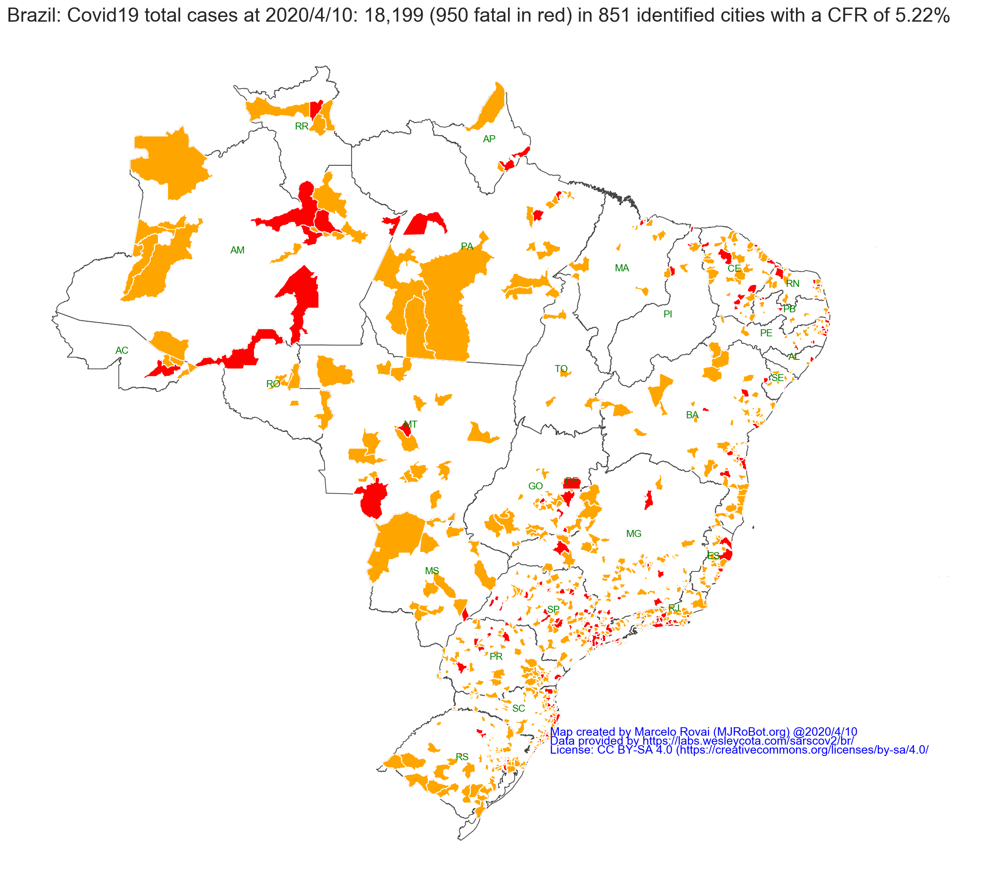

In [917]:
plt_Brasil_cities(cv_city, deaths_city, date, total_cases, deaths, cfr, deaths_only=False)

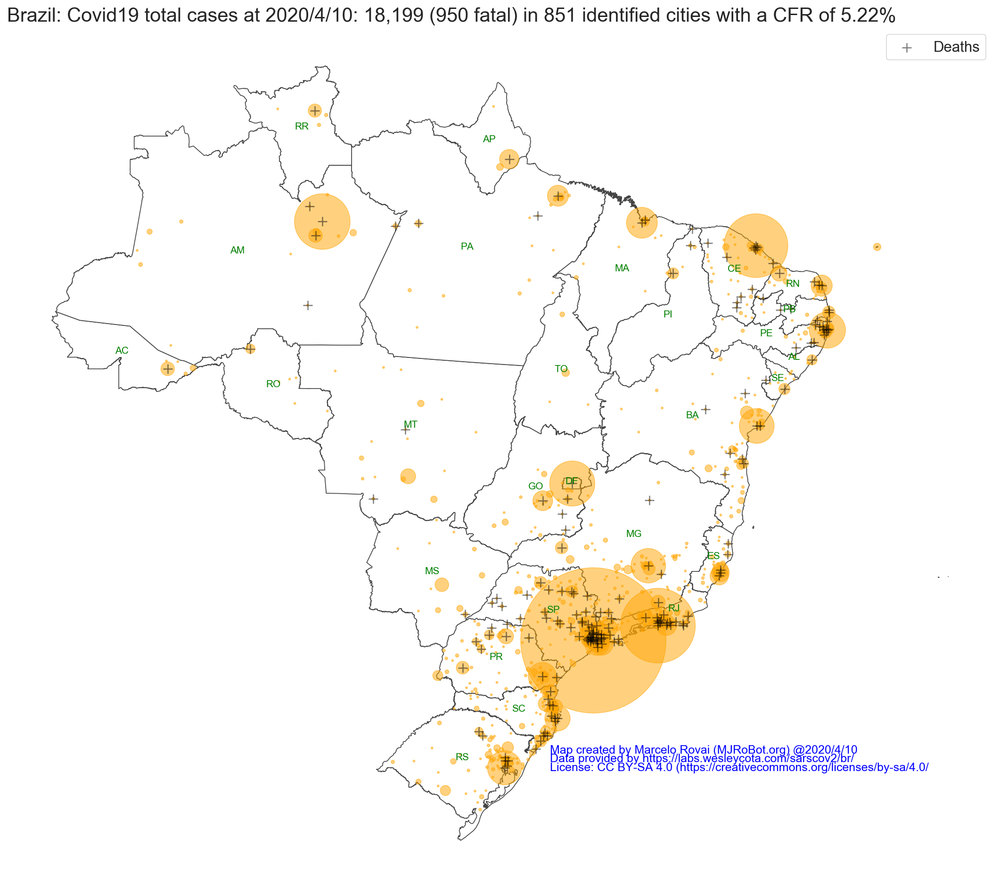

In [916]:
plt_Brasil_cv_metrics(cv_city_pnt, deaths_city_pnt, date, total_cases, deaths, cfr)

**WARNING** 

Position of annotation in final saved figures is different from the ones showed at Notebook

## Other Pandemic metrics maps

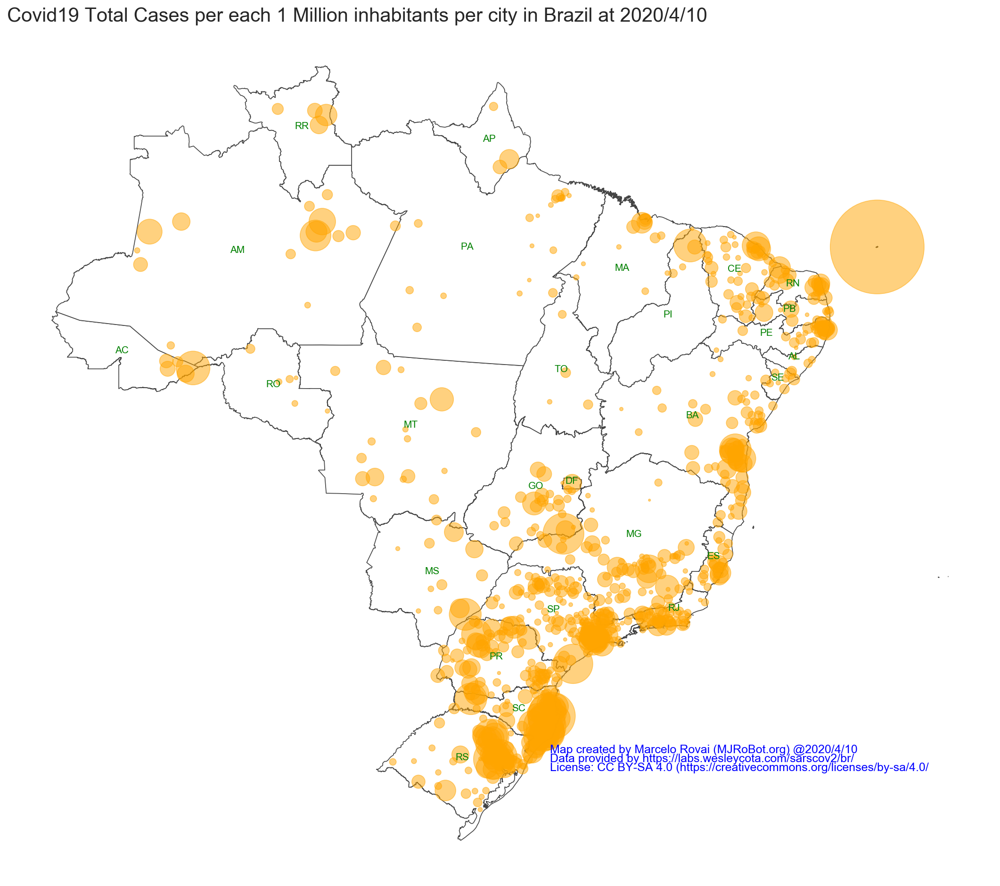

In [906]:
plt_Brasil_cv_metrics(cv_city_pnt, deaths_city_pnt, date, total_cases, deaths, metrics='TotalCases/1M pop', n=2 )

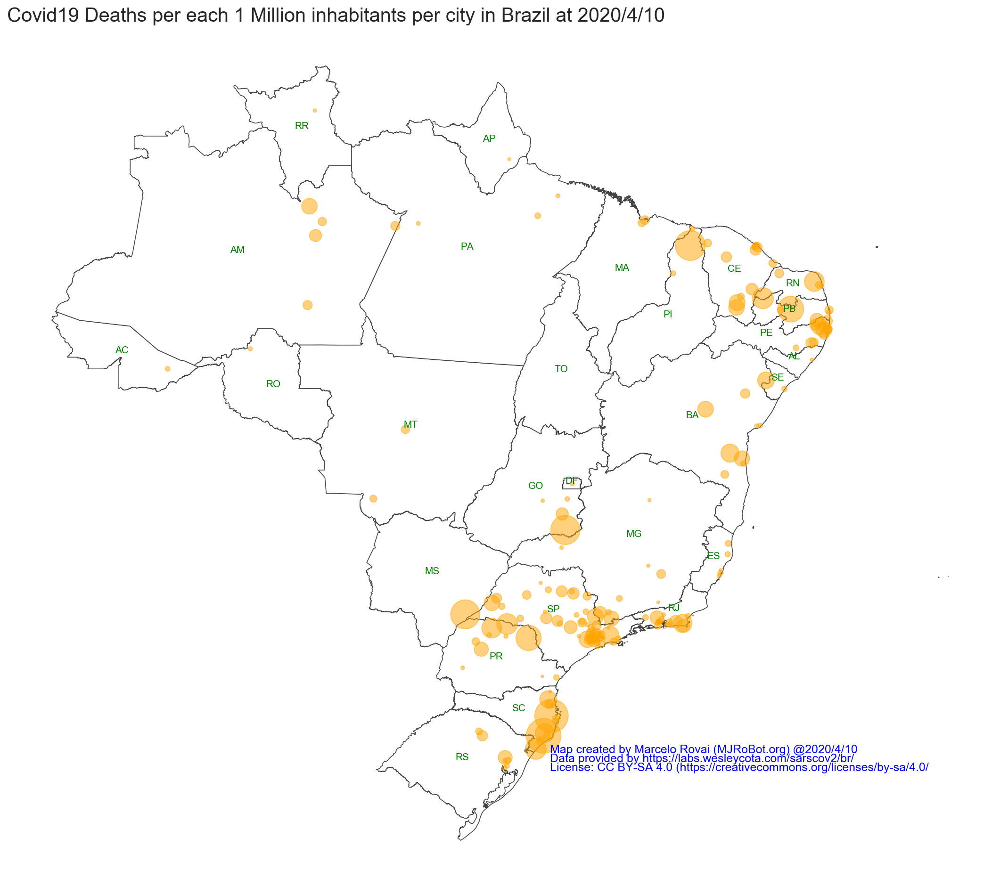

In [907]:
plt_Brasil_cv_metrics(cv_city_pnt, deaths_city_pnt, date, total_cases, deaths, metrics='Deaths/1M pop', n=5 )

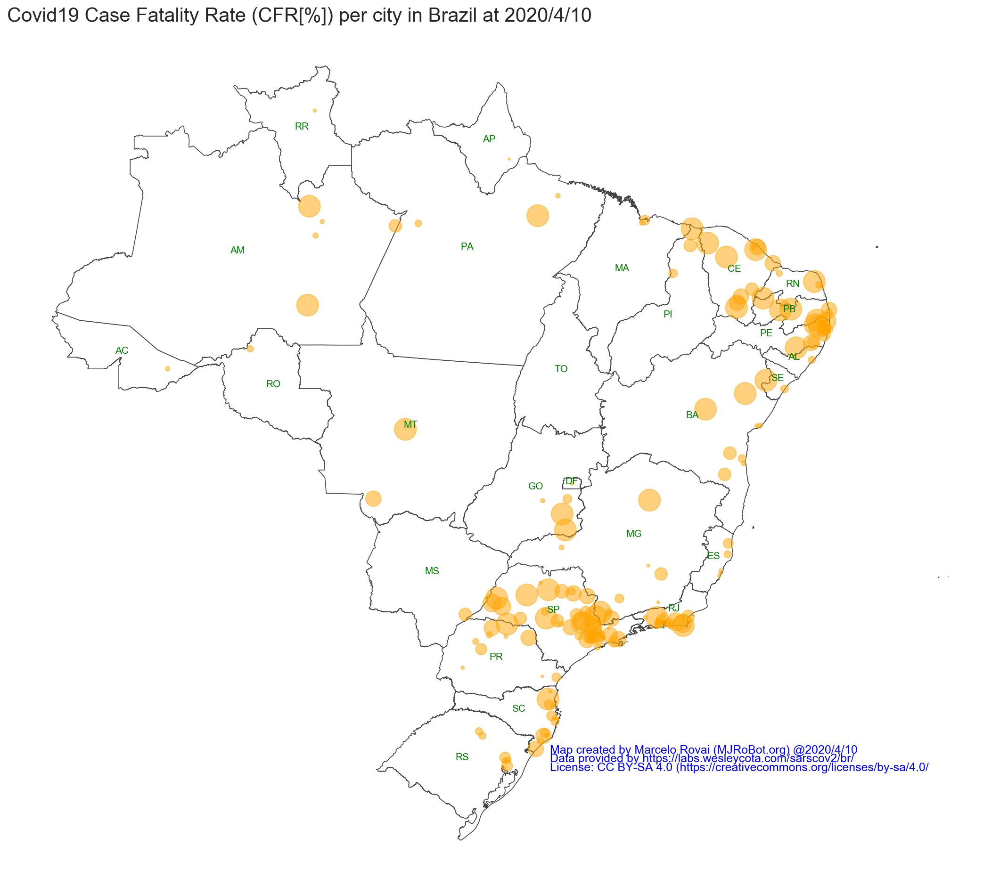

In [908]:
plt_Brasil_cv_metrics(cv_city_pnt, deaths_city_pnt, date, total_cases, deaths, metrics='CFR[%]', n=5 )

### Selected State Analysis

Total number of Covid19 cases reported in SP State at 4/10: 6,708 (428 fatal) in 147 specified cities
Total number of Covid19 cases reported in RJ State at 4/10: 1,938 (106 fatal) in 50 specified cities
Total number of Covid19 cases reported in MG State at 4/10: 615 (14 fatal) in 78 specified cities
Total number of Covid19 cases reported in CE State at 4/10: 1,376 (43 fatal) in 43 specified cities


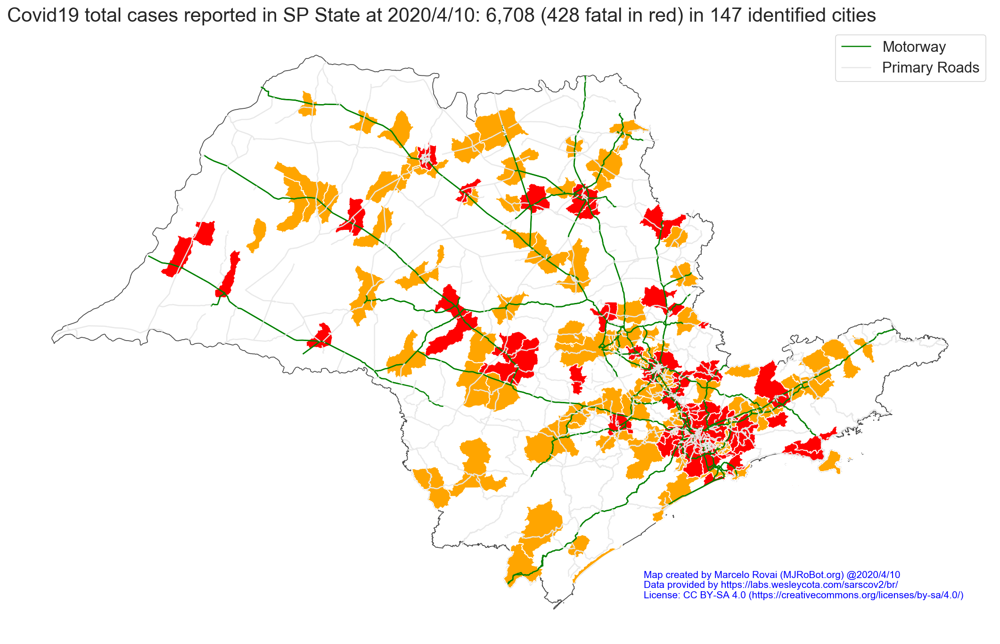

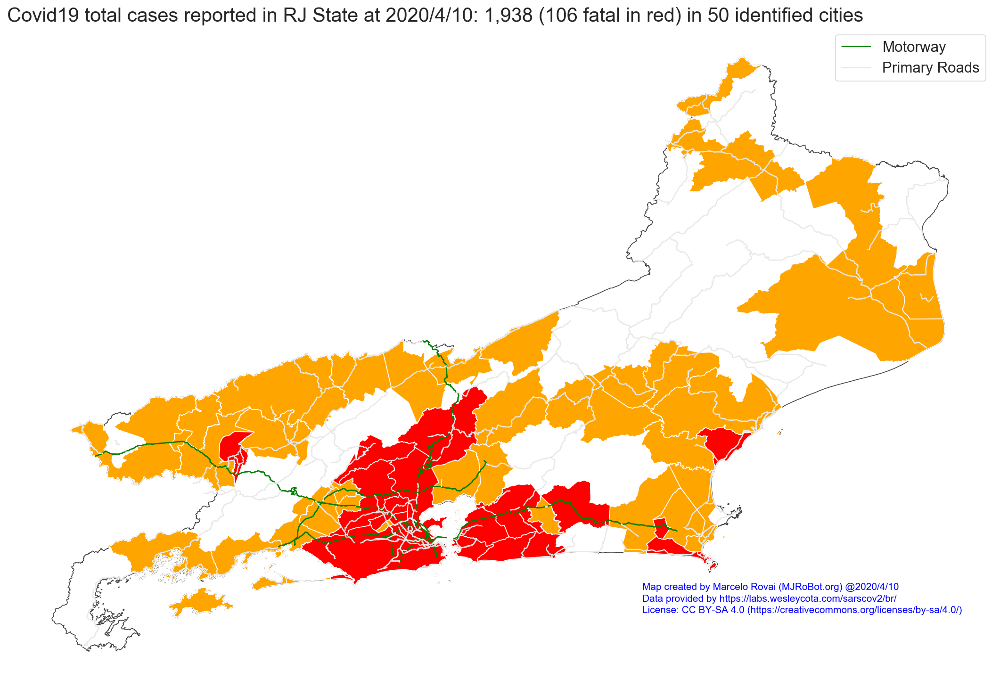

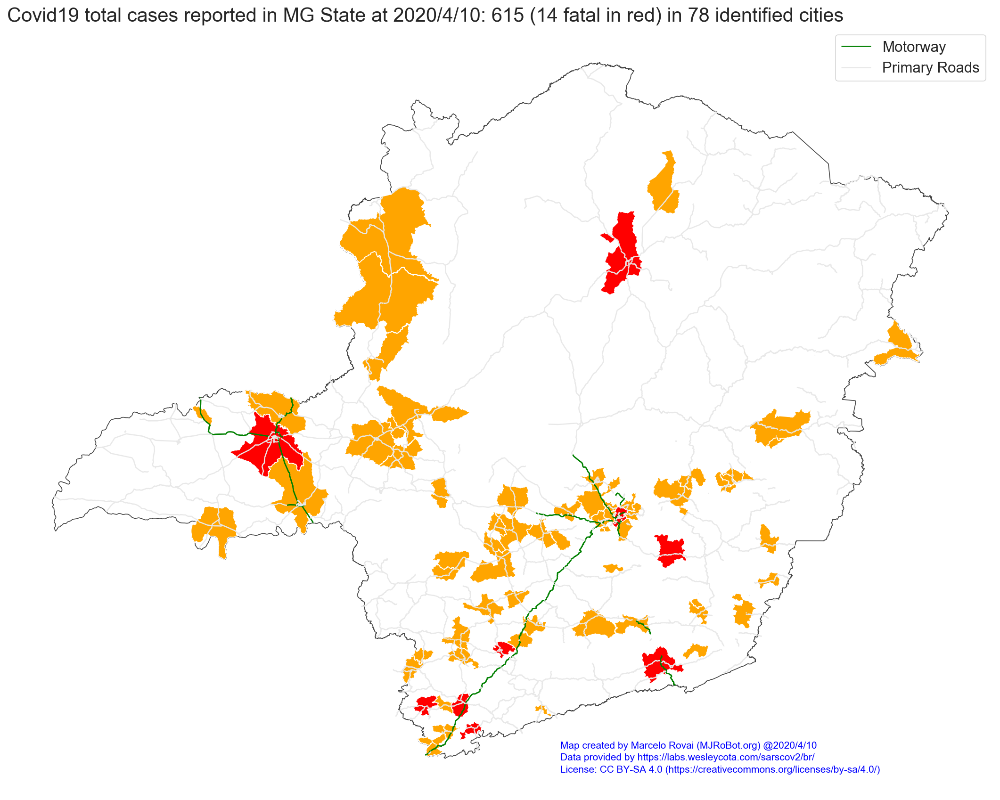

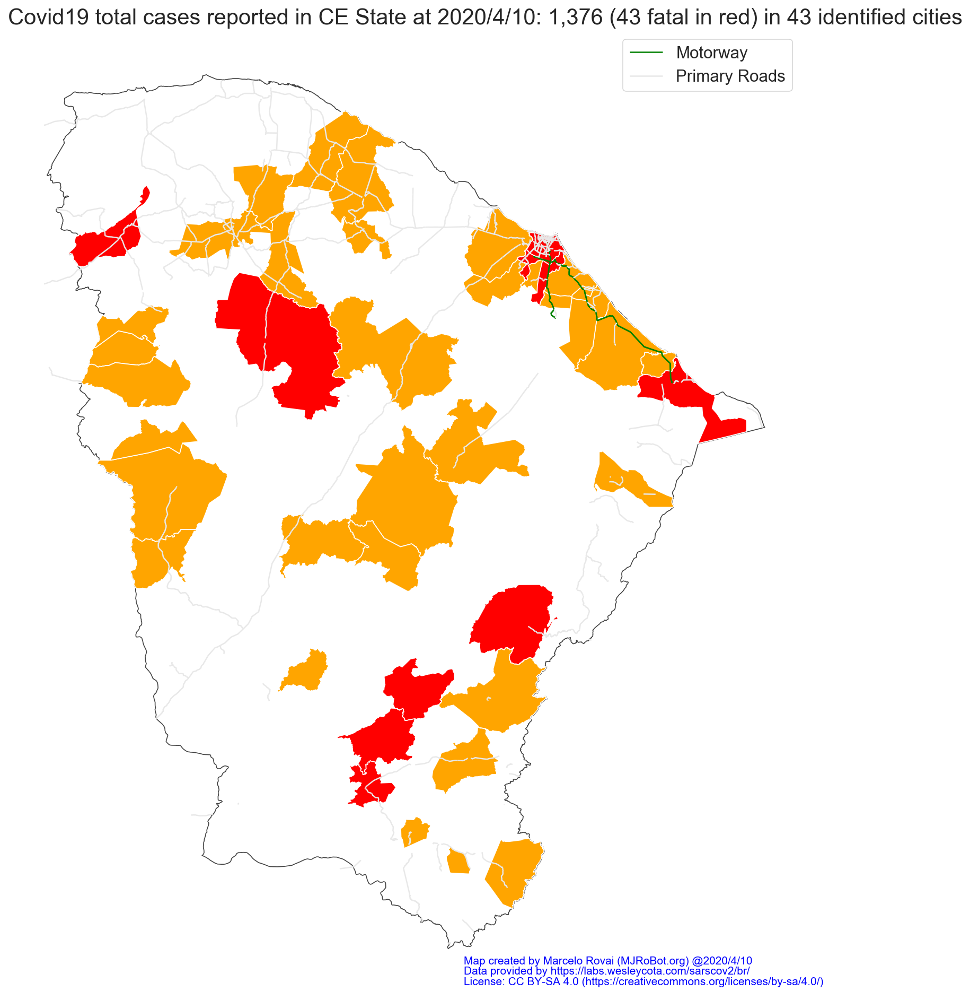

In [918]:
cv_sp, deaths_sp, sp_total_cases, sp_deaths = get_state_info(cv_city, dt_state, 'SP')
cv_rj, deaths_rj, rj_total_cases, rj_deaths = get_state_info(cv_city, dt_state, 'RJ')
cv_mg, deaths_mg, mg_total_cases, mg_deaths = get_state_info(cv_city, dt_state, 'MG')
cv_ce, deaths_ce, ce_total_cases, ce_deaths = get_state_info(cv_city, dt_state, 'CE')

### Analysis 

In [541]:
dtest = cv_city_pnt.sort_values('totalCases', ascending=False).copy()
dtest = dtest[[
    'NOME DO MUNICÍPIO', 'UF', 'POPULAÇÃO ESTIMADA', 'AREA [KMˆ2]',
    'DENS. DEMOG. [hab/kmˆ2]', 'totalCases'
]]

In [542]:
dtest.rename(columns={'totalCases':'TOTAL CASOS'}, inplace=True)

In [543]:
dtest[:20]

,NOME DO MUNICÍPIO,UF,POPULAÇÃO ESTIMADA,AREA [KMˆ2],DENS. DEMOG. [hab/kmˆ2],TOTAL CASOS
0,São Paulo,SP,12252023,"1,810.9","6,765.71",3612
4,Rio de Janeiro,RJ,6718903,"1,413.47","4,753.48",1068
36,Fortaleza,CE,2669342,313.77,"8,507.32",704
5,Brasília,DF,3015268,"6,217.88",484.94,468
23,Manaus,AM,2182763,"11,425.25",191.05,379
40,Belo Horizonte,MG,2512070,374.55,"6,706.9",262
11,Porto Alegre,RS,1483771,660.68,"2,245.82",254
22,Salvador,BA,2872347,729.83,"3,935.64",244
14,Curitiba,PR,1933105,533.15,"3,625.82",172
12,Recife,PE,1645727,223.18,"7,373.99",139


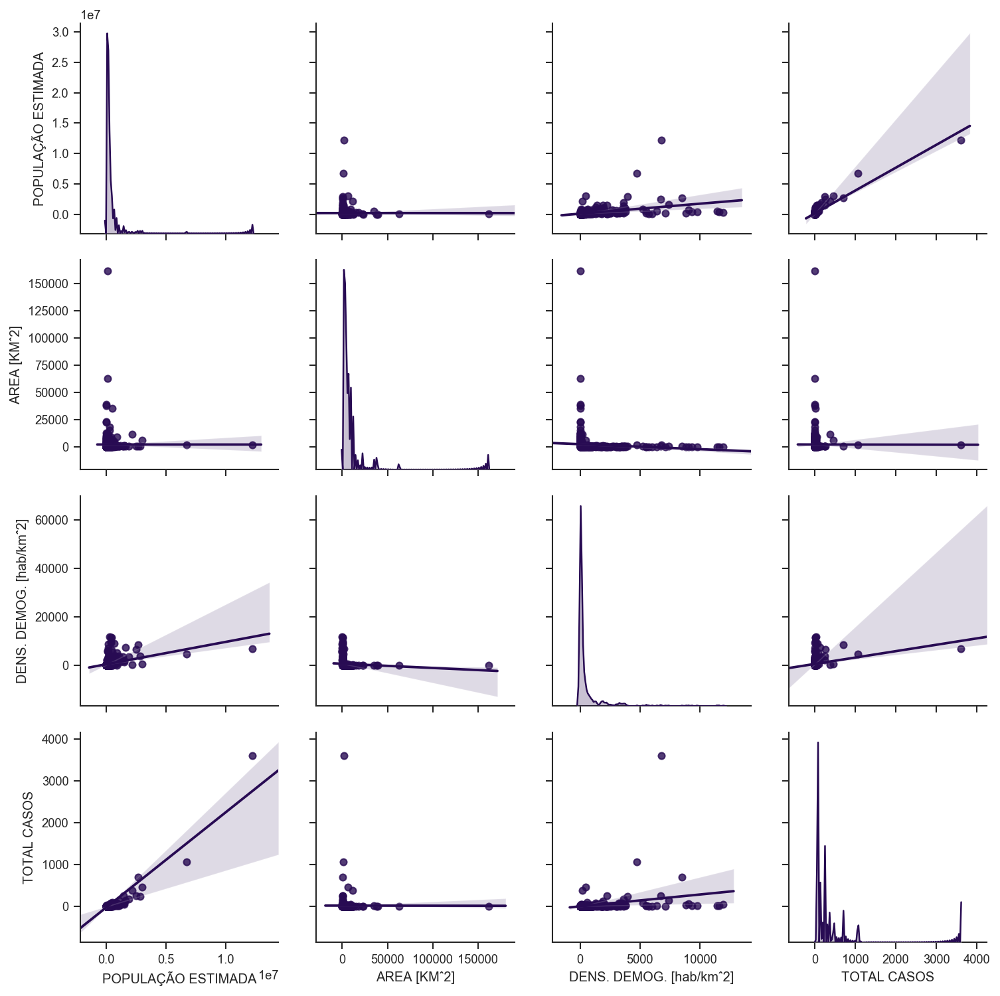

In [544]:
sns.pairplot(dtest, diag_kind="kde", kind="reg");
file = '../images/cv19_PairPlot_'+str(date.month)+'-'+str(date.day)+'-'+str(date.year)+'.png'
plt.savefig(file)

## Creating  GIFs

In [919]:
cv_city_t = pd.merge(dt_tm_city, br_cities, on='COD. IBGE')
cv_city_t = gpd.GeoDataFrame(cv_city_t, crs='4326')
deaths_city_t = cv_city_t.loc[cv_city_t['deaths'] != 0].copy()
dates = list(set(cv_city_t.date))
dates.sort()

In [ ]:
create_state_gif(dates, cv_city_t, deaths_city_t, 'BR')
create_state_gif(dates, cv_city_t, deaths_city_t, 'SP')
create_state_gif(dates, cv_city_t, deaths_city_t, 'RJ')
create_state_gif(dates, cv_city_t, deaths_city_t, 'MG')
create_state_gif(dates, cv_city_t, deaths_city_t, 'CE')